# Color transfer with Optimal transport between GMM

This notebook follows the idea of

[Delon, Desolneux, *A Wasserstein-type distance in the space of Gaussian Mixture Models*, 2019.](https://hal.archives-ouvertes.fr/hal-02178204)





In [3]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn.mixture    

from utils import guided_filter, GaussianMap, GW2

In [4]:
path = 'im/'

# Discrete Optimal Transport between Gaussian Mixtures

## Color transfer with GMM using EMD

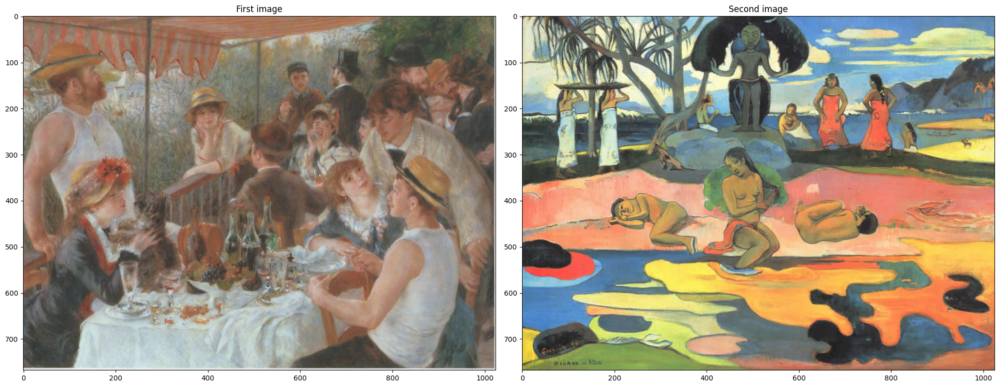

In [5]:
#ATTENTION : if images are of type jpg or bmp, they should be normalized to [0,1] 

# Paintings (same size)
u = plt.imread(path+'renoir.jpg')/255
v = plt.imread(path+'gauguin.jpg')/255

# Paintings 2 (different size)
# u = plt.imread(path+'picasso.jpg')/255
# v = plt.imread(path+'matisse.jpg')/255

# Landscape
# u = plt.imread(path+'spring.jpg')/255
# v = plt.imread(path+'winter.jpg')/255


nru,ncu,nch = u.shape
nrv,ncv,nch = v.shape

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(20, 20))

axes[0].set_title('First image');   axes[0].imshow(u)
axes[1].set_title('Second image');  axes[1].imshow(v)
fig.tight_layout()

### Distribution of color
We display their 3D color scatter plots.

(Text(0.5, 0, 'Red'), Text(0.5, 0.5, 'Green'), Text(0.5, 0, 'Blue'))

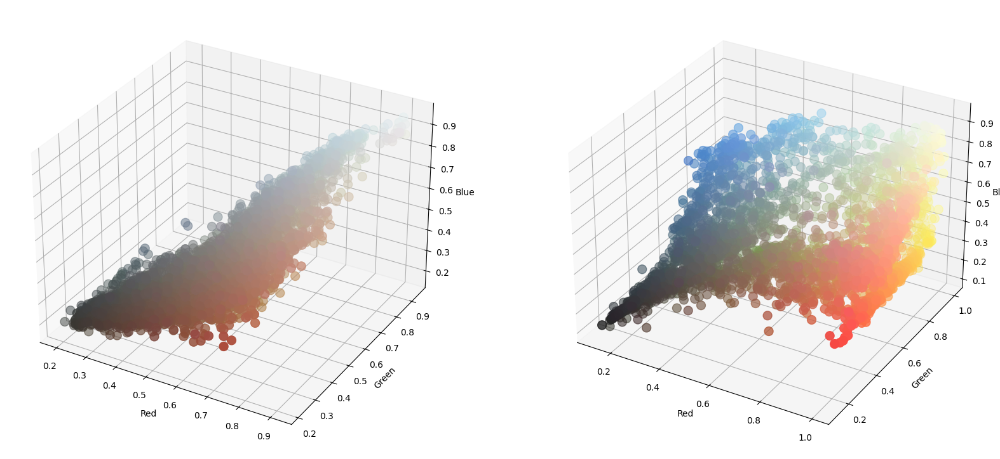

In [6]:
X = u.reshape((-1,3)) # shape N, color
Y = v.reshape((-1,3))

# get only nb random points
nb   = 3500
r    = np.random.RandomState(42) 
idX  = r.randint(X.shape[0], size=(nb,))
idY  = r.randint(Y.shape[0], size=(nb,))
Xs   = X[idX, :]
Ys   = Y[idY, :]

# plot them
fig  = plt.figure(2, figsize=(20, 10))
axis = fig.add_subplot(1, 2, 1, projection="3d")
axis.scatter(Xs[:, 0], Xs[:,1], Xs[:, 2], c=Xs, s=100)
axis.set_xlabel("Red"), axis.set_ylabel("Green"), axis.set_zlabel("Blue")
axis = fig.add_subplot(1, 2, 2, projection="3d")
axis.scatter(Ys[:, 0], Ys[:,1], Ys[:, 2], c=Ys, s=100)
axis.set_xlabel("Red"), axis.set_ylabel("Green"), axis.set_zlabel("Blue")


### Separable optimal transport

First, we show the result of separable optimal transport (implemented here for two images of the same size).

**BE CAREFUL: this implementation works only if u and v have the same size**

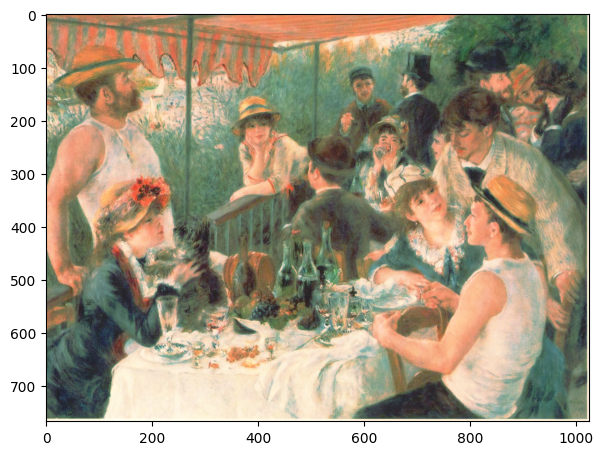

In [ ]:
uout = np.copy(u)

for k in range(3): # for each color channel
    uk = u[:,:,k].ravel()
    vk = v[:,:,k].ravel()   
    index_u = np.argsort(uk)    # position of the pixels by intensity of that channel
    sorted_vk = np.sort(vk)     # value of the pixels by intensity of that channel
    uspecifv = np.zeros(nru*ncu)
    uspecifv[index_u] = sorted_vk  
    uspecifv = uspecifv.reshape((nru,ncu))
    uout[:,:,k] = uspecifv

plt.figure(figsize=(7, 7))
plt.imshow(uout)
plt.show()

### Estimating the GMM with scikit-learn 

We use scikit-learn to compute the GMM from the two color 3d point clouds.

In [ ]:
X = u.reshape((nru*ncu,3))
Y = v.reshape((nrv*ncv,3))
k = 5  # number of classes
ninit = 1
K0, K1 = k, k

gmmX = sklearn.mixture.GaussianMixture(n_components=K0, covariance_type='full',n_init=ninit).fit(X) # spherical or full 
pi0,mu0,S0 = gmmX.weights_, gmmX.means_, gmmX.covariances_ 
ClassesX = gmmX.predict(X)              # predict class for each pixel 
ProbaClassesX = gmmX.predict_proba(X)   # give prob for each class for each pixel 

gmmY = sklearn.mixture.GaussianMixture(n_components=K1, covariance_type='full',n_init=ninit).fit(Y)  # spherical or full 
pi1,mu1,S1 = gmmY.weights_, gmmY.means_, gmmY.covariances_ 
ClassesY = gmmY.predict(Y) 
ProbaClassesY = gmmY.predict_proba(Y)

We can display the following classes on the scatter plots.

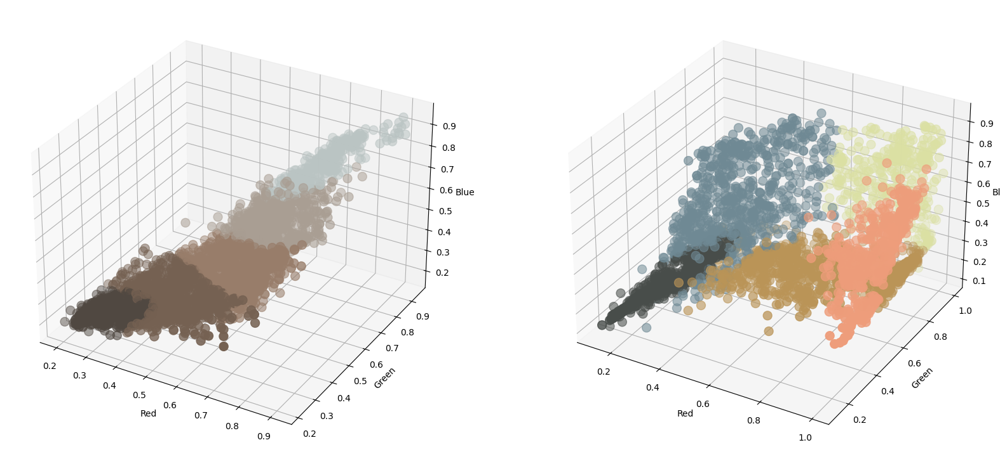

In [15]:
nb   = 3000
r    = np.random.RandomState(42)
idX  = r.randint(X.shape[0], size=(nb,))
idY  = r.randint(Y.shape[0], size=(nb,))
Xs   = X[idX, :]
Ys   = Y[idY, :]
ClassesXsubsample = ClassesX[idX]
ClassesYsubsample = ClassesY[idY]

fig  = plt.figure(2, figsize=(20, 10))
axis = fig.add_subplot(1, 2, 1, projection="3d")
axis.scatter(Xs[:, 0], Xs[:,1],Xs[:, 2], c=mu0[ClassesXsubsample,:],s=100)
axis.set_xlabel("Red"), axis.set_ylabel("Green"), axis.set_zlabel("Blue");
axis = fig.add_subplot(1, 2, 2, projection="3d")
axis.scatter(Ys[:, 0], Ys[:,1],Ys[:, 2], c=mu1[ClassesYsubsample,:],s=100)
axis.set_xlabel("Red"), axis.set_ylabel("Green"), axis.set_zlabel("Blue");

We can also display the segmentations of $u$ and $v$ provided by the GMM (the color of pixels of the same class is the mean of the class)

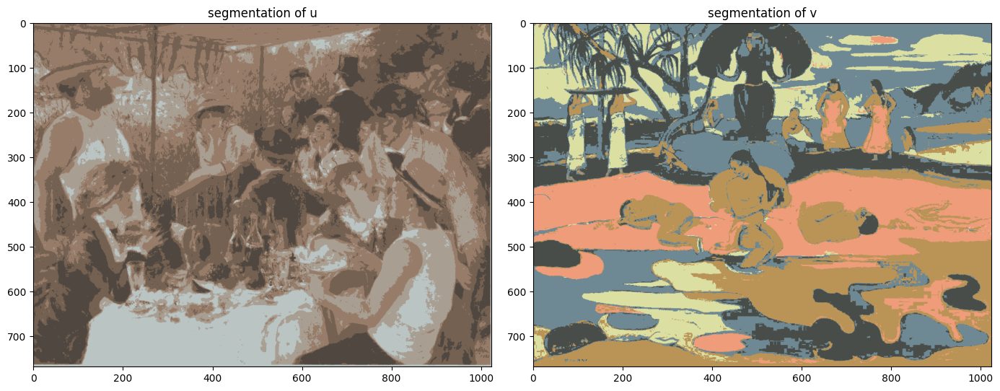

In [16]:
# display the corresponding image segmentations
useg = mu0[ClassesX]
useg = useg.reshape((nru,ncu,3))
vseg = mu1[ClassesY]
vseg = vseg.reshape((nrv,ncv,3))
# display
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(14, 7))
axes[0].imshow(useg)
axes[0].set_title('segmentation of u')
axes[1].imshow(vseg)
axes[1].set_title('segmentation of v')
fig.tight_layout()

### Use GW2 for color transfer 

Then, we can use the GW2 transport map between these two GMM for color transfer.

In [18]:
# Compute the K0xK1 matrix between the members of the mixtures
wstar, dist = GW2(pi0/np.sum(pi0),pi1/np.sum(pi1),mu0,mu1,S0,S1)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05065061842100165..1.4393742474592663].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.058222403164782444..1.4978082852542898].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05071012596204201..1.48791125131066].


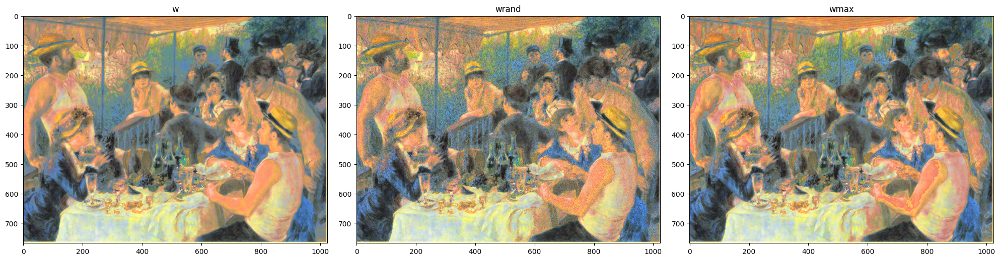

In [19]:
# Compute all Tkl maps at all points of u 
T = np.zeros((K0,K1,3,nru*ncu))
for k in range(K0):
    for l in range(K1):
        T[k,l,:,:] = GaussianMap(mu0[k,:],mu1[l,:],S0[k,:,:],S1[l,:,:],X).T   
            
# Compute mean color transfer on all points
Tmeanx = np.zeros((3,nru*ncu))
for k in range(K0):
    for l in range(K1):
        Tmeanx += wstar[k,l]/pi0[k]*ProbaClassesX[:,k].T*T[k,l,:,:]
                
# Compute random color transfer on all points (random sample with posterior distribution)
Trandx = np.zeros((3,nru*ncu))
tmp = np.zeros((K0*K1,nru*ncu))
for k in range(K0):
    for l in range(K1):
        tmp[k+K0*l,:]= wstar[k,l]/pi0[k]*ProbaClassesX[:,k]
for i in range(nru*ncu):
    m = np.random.choice(K0*K1,p=tmp[:,i])
    l = m//K0
    k = m - K0*l
    Trandx[:,i] = T[k,l,:,i]        

    
# Compute best color transfer on all points (only best class for each point)
Tmaxx = np.zeros((3,nru*ncu))
normalisation = np.zeros((nru*ncu))
for k in range(K0):
    for l in range(K1):
        Tmaxx += wstar[k,l]*T[k,l,:,:]*(ClassesX==k).T
        normalisation +=wstar[k,l]*(ClassesX==k).T
Tmaxx = Tmaxx/normalisation


# Display result as an image
w=Tmeanx.T.reshape((nru,ncu,3))
wmax=Tmaxx.T.reshape((nru,ncu,3))
wrand=Trandx.T.reshape((nru,ncu,3))


#we display the images
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 20))
axes[0].imshow(w)
axes[0].set_title('w')
axes[1].imshow(wrand)
axes[1].set_title('wrand')
axes[2].imshow(wmax)
axes[2].set_title('wmax')
fig.tight_layout()

# Result regularization

A common drawback of classical methods aiming at color and contrast modifications is the revealing of artefacts (JPEG blocs, color inconsistancies, noise enhancement) or the attenuation of details and textures (see for instance the following [web page](http://perso.telecom-paristech.fr/~delon/artefact_removal_html/)). 
Let $u$ be an image and $g(u)$ the same  image after color or contrast modification, we write $\mathcal{M}(u) = g(u) - u$. All artefacts observable in $g(u)$ can be seen as irregularities in these difference map $\mathcal{M}(u)$. In order to reduce these artefacts, we propose to filter this difference map thanks to an operator $Y_u$ and to reconstruct the image:

$$T(g(u)) = u + Y_u(g(u)-u).$$

We will use for $Y_u$ the guided filter described in the paper

[*Guided Image Filtering*, Kaiming He1, Jian Sun2, and Xiaoou Tang, ECCV 2010.](http://kaiminghe.com/publications/eccv10guidedfilter.pdf)


In [20]:
diff = w-u
out = np.zeros_like(u)

for i in range(3):
    out[:,:,i] = guided_filter(diff[:,:,i],u[:,:,i], 10,1e-4 )

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.013540607769033736..1.3363722508611222].


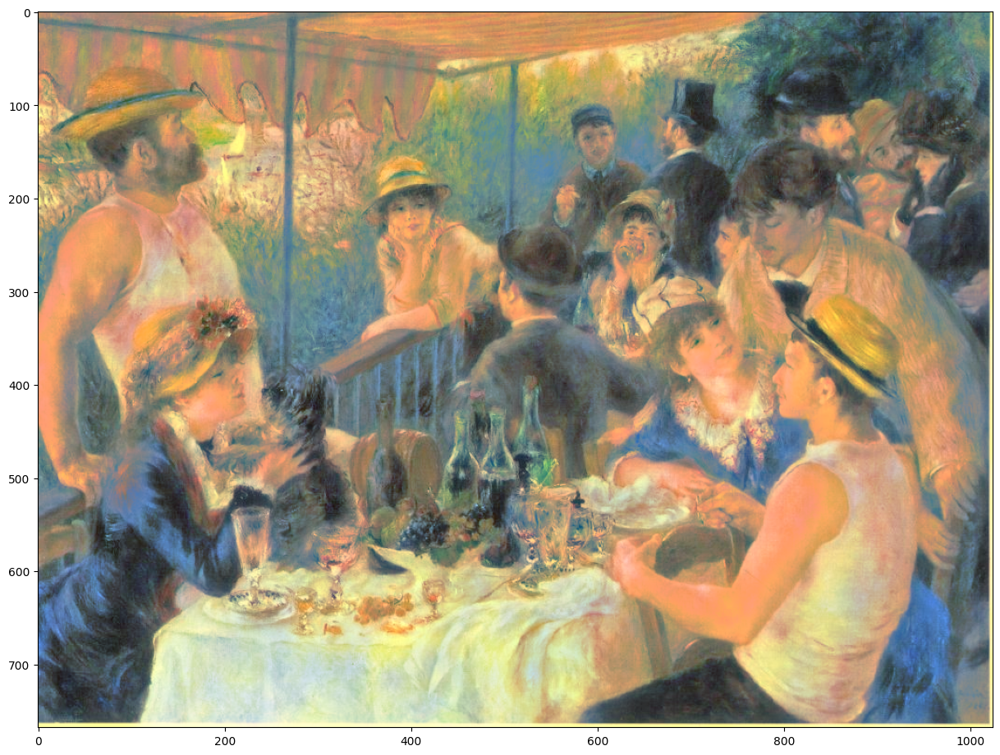

In [21]:
#we display the result
plt.figure(figsize=(15, 15))
plt.imshow(out+u)
plt.show()